## Static potential problem in python notebook


Using the *body class* to plot the results

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib.animation as animation
from scipy.integrate import solve_ivp
from IPython.display import display, clear_output, HTML

from physics import mover

In [2]:
#Initial conditions
a = mover(mass = 1.0, q0 = [-10,0], v0 = [0.0, -0.5], name = 'A')
b = mover(mass = 1.0, q0 = [10,0], v0 = [0.0, 0.5], name = 'B')

bodies = [a, b]
N = len(bodies)
d = 2 #dimensions

t0, tf, dt = 0.0, 50.0, 0.01
T = np.arange(t0, tf, dt)

In [3]:
# Differential function
def f(t,y):
  q , v = y[0:d], y[d:2*d]
  dq = v
  u_q = q/np.linalg.norm(q) #q versor
  dp = -5*np.linalg.norm(q)**(-2)*u_q
  return np.append(dq, dp)
  
  
a.solve_ODE(f,T)
b.solve_ODE(f,T)


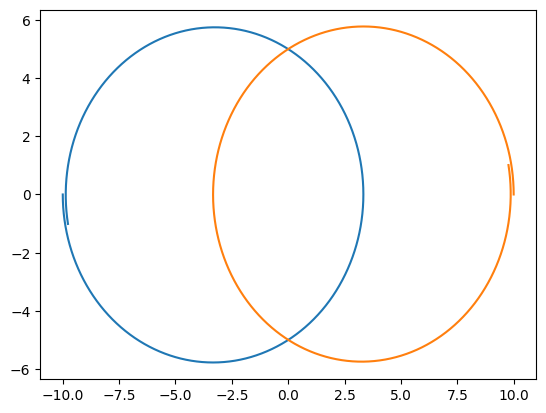

In [4]:
plt.plot(a.trace()[0],a.trace()[1])
plt.plot(b.trace()[0],b.trace()[1])

### Animations

In [5]:
fig, ax = plt.subplots()
ax.set_aspect('equal')
fig.suptitle('N corpi')
for a in bodies:
  a.marker, = ax.plot([-20,20],[-20,20], 'd')
  a.trace_plot, = ax.plot([-20,20],[-20,20], linestyle = '-', color = a.marker.get_color())
  a.marker.set_label(a.name)
  
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.grid()
time_label = ax.text(0.05,0.9, '', transform = ax.transAxes)
plt.legend()

plt.close('all')

In [6]:
def animate(i, n_frames=None, n_points=None):
  n = round(i*n_points/n_frames) #Mapping the number of points to be added for each frame
  for a in bodies:
    a.marker.set_data(a.q(n)[0], a.q(n)[1])  #Plot the positions
    a.trace_plot.set_data(a.trace(n)[0], a.trace(n)[1])  #Plot the positions
    time_label.set_text(f'Time {T[n]:.2f}') 

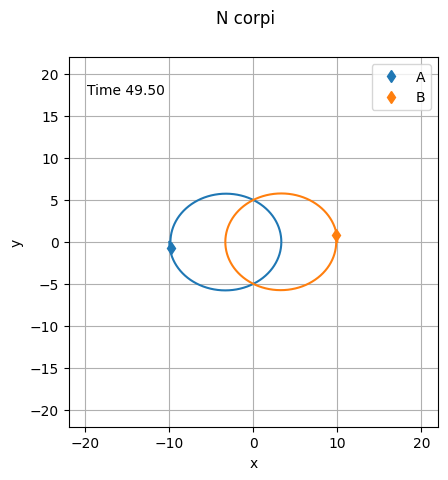

In [7]:
n_frames = 100
n_points = len(T)

for i in range(n_frames):
    animate(i, n_frames, n_points)
    clear_output(wait=True) 
    display(fig)

In [8]:
duration = tf #duration in seconds
fps = 10
n_frames = round(duration*fps) #total of frames to be drawn
n_points = len(T)
ani = animation.FuncAnimation(fig, animate, n_frames, fargs = (n_frames,n_points), interval = 1000.0/fps)
plt.close('all')
HTML(ani.to_jshtml())

/tmp/ipykernel_8621/2715586240.py:4: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  a.marker.set_data(a.q(n)[0], a.q(n)[1])  #Plot the positions
